# Continuation of "irregular_1"

## A cycle of reactions A <-> B <-> C <-> A, 
The "closing" of the cycle (the "return" parth from C to A) is couple with an "energy donor" reaction:
C + E_High <-> A + E_Low

LAST REVISED: Jan. 21, 2023

In [1]:
# Extend the sys.path variable, to contain the project's root directory
import set_path
set_path.add_ancestor_dir_to_syspath(2)  # The number of levels to go up 
                                         # to reach the project's home, from the folder containing this notebook

Added 'D:\Docs\- MY CODE\BioSimulations\life123-Win7' to sys.path


In [2]:
from experiments.get_notebook_info import get_notebook_basename

from modules.reactions.reaction_data import ReactionData as chem
from modules.reactions.reaction_dynamics import ReactionDynamics

import numpy as np
import plotly.express as px
from modules.visualization.graphic_log import GraphicLog

In [3]:
# Initialize the system
chem_data = chem(names=["A", "B", "C", "E_high", "E_low"])

# Reaction A <-> B, mostly in forward direction (favored energetically)
# Note: all reactions in this experiment have 1st-order kinetics for all species
chem_data.add_reaction(reactants="A", products="B",
                       forward_rate=9., reverse_rate=3.)

# Reaction B <-> C, also favored energetically
chem_data.add_reaction(reactants="B", products="C",
                       forward_rate=8., reverse_rate=4.)

# Reaction C + E_High <-> A + E_Low, also favored energetically, but kinetically slow
# Note that, thanks to the energy donation from E, we can go "upstream" from C, to the higher-energy level of "A"
chem_data.add_reaction(reactants=["C" , "E_high"], products=["A", "E_low"],
                       forward_rate=1., reverse_rate=0.2)

chem_data.describe_reactions()

Number of reactions: 3 (at temp. 25 C)
0: A <-> B  (kF = 9 / kR = 3 / Delta_G = -2,723.41 / K = 3) | 1st order in all reactants & products
1: B <-> C  (kF = 8 / kR = 4 / Delta_G = -1,718.28 / K = 2) | 1st order in all reactants & products
2: C + E_high <-> A + E_low  (kF = 1 / kR = 0.2 / Delta_G = -3,989.73 / K = 5) | 1st order in all reactants & products


In [4]:
initial_conc = {"A": 100., "B": 0., "C": 0., "E_high": 1000., "E_low": 0.}  # Note the abundant energy source
initial_conc

{'A': 100.0, 'B': 0.0, 'C': 0.0, 'E_high': 1000.0, 'E_low': 0.0}

# _COARSE_ FIXED-RESOLUTION

In [5]:
dynamics2 = ReactionDynamics(reaction_data=chem_data)
dynamics2.set_conc(conc= initial_conc,
                  snapshot=True)      
dynamics2.describe_state()

SYSTEM STATE at Time t = 0:
5 species:
  Species 0 (A). Conc: 100.0
  Species 1 (B). Conc: 0.0
  Species 2 (C). Conc: 0.0
  Species 3 (E_high). Conc: 1000.0
  Species 4 (E_low). Conc: 0.0


In [6]:
# time_step values are picked as large as possible, but short of causing errors
dynamics2.single_compartment_react(time_step=0.0005,stop_time=0.005)

In [7]:
dynamics2.single_compartment_react(time_step=0.001,stop_time=0.2)

In [8]:
dynamics2.single_compartment_react(time_step=0.002, stop_time=3.)

In [9]:
dynamics2.single_compartment_react(time_step=0.005, stop_time=8.)

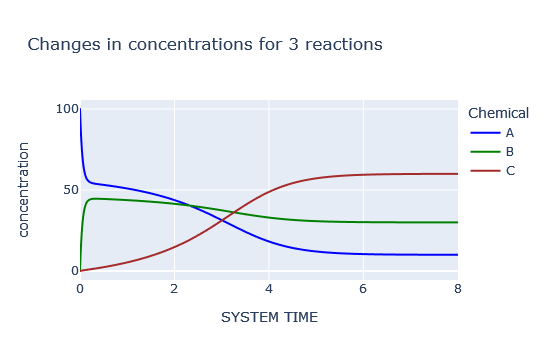

In [23]:
dynamics2.plot_curves(chemicals=["A", "B", "C"])

In [11]:
len(dynamics2.get_history())

2607

In [12]:
dynamics2.get_history(t_start=2.31, t_end=2.33)

,SYSTEM TIME,A,B,C,E_high,E_low,caption
1261,2.312,40.507282,40.414079,19.078639,306.597912,693.402088,
1262,2.314,40.484444,40.406730,19.108827,306.134104,693.865896,
1263,2.316,40.461581,40.399372,19.139047,305.670687,694.329313,
1264,2.318,40.438695,40.392007,19.169298,305.207661,694.792339,
1265,2.320,40.415786,40.384633,19.199581,304.745026,695.254974,
1266,2.322,40.392852,40.377252,19.229895,304.282783,695.717217,
1267,2.324,40.369896,40.369863,19.260241,303.820932,696.179068,
1268,2.326,40.346915,40.362466,19.290619,303.359473,696.640527,
1269,2.328,40.323911,40.355061,19.321028,302.898408,697.101592,
1270,2.330,40.300883,40.347649,19.351468,302.437736,697.562264,


In [13]:
dynamics2.curve_intersection(t_start=2.31, t_end=2.33, var1="A", var2="B")

1267


(2.3239999999999656, 40.369895519361684)

In [15]:
dynamics2.curve_intersection(t_start=3., t_end=4., var1="B", var2="C")

1657


(3.2599999999998857, 36.202648453372866)

In [15]:
dynamics2.curve_intersection(t_start=3., t_end=4., var1="B", var2="C")

1657


(3.2599999999998857, 36.202648453372866)

# START OVER WITH _FINE_ FIXED-RESOLUTION

In [16]:
dynamics3 = ReactionDynamics(reaction_data=chem_data)
dynamics3.set_conc(conc= initial_conc,
                  snapshot=True)      
dynamics3.describe_state()

SYSTEM STATE at Time t = 0:
5 species:
  Species 0 (A). Conc: 100.0
  Species 1 (B). Conc: 0.0
  Species 2 (C). Conc: 0.0
  Species 3 (E_high). Conc: 1000.0
  Species 4 (E_low). Conc: 0.0


In [17]:
# Using the smallest time_step value that was ever used in the subset of the VARIABLE-resolution run
dynamics3.single_compartment_react(time_step=0.00025, stop_time=8.)

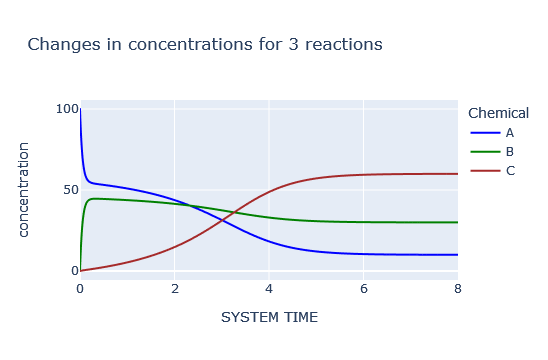

In [24]:
dynamics3.plot_curves(chemicals=["A", "B", "C"])

In [19]:
len(dynamics3.get_history())

32001

In [20]:
dynamics3.curve_intersection(t_start=2.31, t_end=2.33, var1="A", var2="B")

9297


(2.3242500000000716, 40.37092421287142)

In [21]:
dynamics3.curve_intersection(t_start=3., t_end=4., var1="A", var2="C")

12040


(3.0099999999996916, 31.293405696050463)

In [22]:
dynamics3.curve_intersection(t_start=3., t_end=4., var1="B", var2="C")

13051


(3.2627499999995515, 36.1940889802955)